In [ ]:
from pystac_client import Client
import rasterio as rio
import rioxarray

earth_element = 'https://earth-search.aws.element84.com/v1' 
catalog = Client.open(earth_element)

# check the catalog
catalog

<Client id=earth-search-aws>

In [2]:
collections = catalog.get_all_collections()
collection  = next(collections)
collection

<CollectionClient id=sentinel-2-pre-c1-l2a>

In [5]:
for collection in collections:
    print(collection.id)

cop-dem-glo-30
naip
cop-dem-glo-90
landsat-c2-l2
sentinel-2-l2a
sentinel-2-l1c
sentinel-2-c1-l2a
sentinel-1-grd


In [144]:
# get one of the connection images
collection = catalog.get_collection("sentinel-2-l2a")
collection

<CollectionClient id=sentinel-2-l2a>

In [11]:
items = collection.get_items()
next(items)

<Item id=LC09_L2SR_087122_20250116_02_T2>

In [14]:
results = catalog.search()
results

In [ ]:
results.matched()

107209214

In [66]:
aoi = {
        "coordinates": [
          [
            [
              7.382403875680609,
              9.121940008320934
            ],
            [
              7.382403875680609,
              8.970858842267603
            ],
            [
              7.530440758439795,
              8.970858842267603
            ],
            [
              7.530440758439795,
              9.121940008320934
            ],
            [
              7.382403875680609,
              9.121940008320934
            ]
          ]
        ],
        "type": "Polygon"
      }

 # you can query by cloud_cover level, and also query by platform
    query= {"eo:cloud_cover": {"lt": cloud_cover},
            "platform":{"in":['landsat-7','landsat-5']}}  ,    
    sortby= ["eo:cloud_cover"]

In [74]:
results = catalog.search(
    collections=["sentinel-2-l2a"],
    intersects = aoi,
    datetime=["2024"],
    
    # query cloud
    # you can query by cloud_cover level, and also query by platform
    query=["eo:cloud_cover<5"],
    sortby=["+properties.eo:cloud_cover"],



)

results.matched()

24

In [87]:
items = results.item_collection()
items

In [88]:
items[0]

<Item id=S2A_32PLQ_20241127_0_L2A>

In [89]:
items[0].geometry

{'type': 'Polygon',
 'coordinates': [[[7.18048572299897, 9.042218880663892],
   [7.18518332309541, 8.050469180291136],
   [7.945501514827016, 8.053308233965758],
   [8.169602919325314, 9.045793763926666],
   [7.18048572299897, 9.042218880663892]]]}

In [90]:
image = items[0]

In [91]:
image.assets

{'aot': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_20241127_0_L2A/AOT.tif>,
 'blue': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_20241127_0_L2A/B02.tif>,
 'coastal': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_20241127_0_L2A/B01.tif>,
 'granule_metadata': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_20241127_0_L2A/granule_metadata.xml>,
 'green': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_20241127_0_L2A/B03.tif>,
 'nir': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_20241127_0_L2A/B08.tif>,
 'nir08': <Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_202

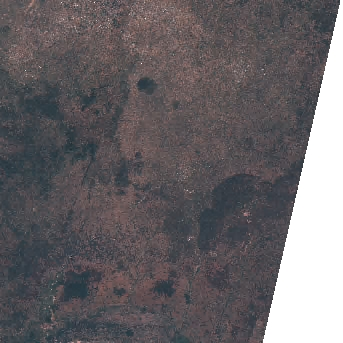

In [92]:
import urllib.request
from IPython.display import Image

url = image.assets['thumbnail'].href
# dowload thumbmail
urllib.request.urlretrieve(url,'thumbmail.jpeg')
#display the image in the notebook
Image(url)

In [95]:
import odc.stac

bands = ['red','blue','green','nir08']

stack_image = odc.stac.stac_load(
    [image],bands=bands,geopolygon=aoi
).isel(time=0)



In [96]:
stack_image

<xarray.Dataset> Size: 22MB
Dimensions:      (y: 1679, x: 1636)
Coordinates:
  * y            (y) float64 13kB 1.009e+06 1.009e+06 ... 9.92e+05 9.92e+05
  * x            (x) float64 13kB 3.222e+05 3.222e+05 ... 3.385e+05 3.385e+05
    spatial_ref  int32 4B 32632
    time         datetime64[ns] 8B 2024-11-27T10:08:24.320000
Data variables:
    red          (y, x) uint16 5MB 0 0 0 0 0 0 0 ... 876 799 830 799 1038 968
    blue         (y, x) uint16 5MB 0 0 0 0 0 0 0 ... 516 497 434 445 507 548 548
    green        (y, x) uint16 5MB 0 0 0 0 0 0 0 ... 770 728 672 702 683 800 748
    nir08        (y, x) uint16 5MB 0 0 0 0 0 0 ... 2706 2706 2687 2687 2509 2509

In [97]:
image

<Item id=S2A_32PLQ_20241127_0_L2A>

In [146]:
scale = image.assets["aot"]
scale

<Asset href=https://sentinel-cogs.s3.us-west-2.amazonaws.com/sentinel-s2-l2a-cogs/32/P/LQ/2024/11/S2A_32PLQ_20241127_0_L2A/AOT.tif>

In [150]:
# Define scale factor and offset
scale_factor = 0.0000275
offset = -0.2

# Scale imagery for 2023
composite_image = (stack_image * scale_factor) + offset


composite_image.where(composite_image != 0)

<xarray.Dataset> Size: 88MB
Dimensions:      (y: 1679, x: 1636)
Coordinates:
  * y            (y) float64 13kB 1.009e+06 1.009e+06 ... 9.92e+05 9.92e+05
  * x            (x) float64 13kB 3.222e+05 3.222e+05 ... 3.385e+05 3.385e+05
    spatial_ref  int32 4B 32632
    time         datetime64[ns] 8B 2024-11-27T10:08:24.320000
Data variables:
    red          (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.178 -0.1715 -0.1734
    blue         (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.1861 -0.1849 -0.1849
    green        (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.1812 -0.178 -0.1794
    nir08        (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.1261 -0.131 -0.131

In [136]:
composite_image

<xarray.Dataset> Size: 88MB
Dimensions:      (y: 1679, x: 1636)
Coordinates:
  * y            (y) float64 13kB 1.009e+06 1.009e+06 ... 9.92e+05 9.92e+05
  * x            (x) float64 13kB 3.222e+05 3.222e+05 ... 3.385e+05 3.385e+05
    spatial_ref  int32 4B 32632
    time         datetime64[ns] 8B 2024-11-27T10:08:24.320000
Data variables:
    red          (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.178 -0.1715 -0.1734
    blue         (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.1861 -0.1849 -0.1849
    green        (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.1812 -0.178 -0.1794
    nir08        (y, x) float64 22MB -0.2 -0.2 -0.2 ... -0.1261 -0.131 -0.131

In [151]:
# downlod the stac image as a raste file 
composite_image.where(composite_image != 0).rio.to_raster("rgb_image.tif")

In [158]:
import matplotlib.pyplot as plt

rio.plot.show(composite_image.read(1))

AttributeError: module 'rasterio' has no attribute 'plot'

https://mapscaping.com/rgb-composites-of-multi-band-raster-data-using-python/
https://corteva.github.io/rioxarray/stable/examples/convert_to_raster.html